## Preprocessing

In [1]:
%%javascript
// disabling auto scroll
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [2]:
# Preprocessing
# import Modules
%pip install pandas # validate module installation
%pip install xmltodict # validate module installation
%pip install geonamescache # validate module installation
%pip install matplotlib # validate module installation
%pip install networkx # validate module installation
%pip install jgraph # validate module installation
%pip install plotly # validate module installation
import sqlite3, xmltodict, geonamescache, jgraph, json, os
import networkx as nx
import pandas as pd
from os import listdir
from os.path import isfile, join, relpath, dirname
from IPython.display import IFrame
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
''' dump raw data into sqlite3 database '''
db_name = 'datascience_stackexchange_csc501.db'
raw_data_file_path = 'datascience_stackexchange_com'
# db connection
conn = sqlite3.connect(db_name, detect_types=sqlite3.PARSE_DECLTYPES)


def xml_to_sqlite3(file_path: str, conn: sqlite3.Connection):
    '''
    convert stackexchange XML raw file into SQLite3 database
    '''
    raw_text = open(file_path)
    xmlDict = xmltodict.parse(raw_text.read())
    print(file_path)
    table_name = list(xmlDict.keys())[0]
    print('creating table:', table_name)
    conn.cursor().execute(''' DROP TABLE IF EXISTS {tname}; '''.format(tname=table_name))
    filedf = pd.DataFrame.from_dict(xmlDict[table_name]['row'])
    columns = [c.strip('@') for c in filedf.columns.values.tolist()]
    filedf.columns = columns
    # datetime64 and int64
    for col in filedf.columns:
        if filedf[col].dtype == 'object':
            try:
                filedf[col] = filedf[col].astype('datetime64[ns]')
            except ValueError:
                try:
                    filedf[col] = pd.to_numeric(filedf[col])
                    filedf[col] = filedf[col].astype('Int64')
                except ValueError:
                    pass
#         print(col, ':', filedf[col].dtype)
    filedf.to_sql(name=table_name, con=conn, index=False)
    pass


for raw_file in listdir(raw_data_file_path):
    raw_file_path = join(raw_data_file_path, raw_file)
    if isfile(raw_file_path) and raw_file_path.endswith('.xml'):
        try:
            xml_to_sqlite3(file_path=raw_file_path, conn=conn)
        except:
            pass

datascience_stackexchange_com/Comments.xml
creating table: comments
datascience_stackexchange_com/Users.xml
creating table: users
datascience_stackexchange_com/Votes.xml
creating table: votes
datascience_stackexchange_com/Tags.xml
creating table: tags
datascience_stackexchange_com/PostHistory.xml
creating table: posthistory
datascience_stackexchange_com/PostLinks.xml
creating table: postlinks
datascience_stackexchange_com/Posts.xml
creating table: posts
datascience_stackexchange_com/Badges.xml
creating table: badges


In [3]:
# create indexes on tables
c = conn.cursor()
# badges
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS badges_id_uidx ON badges (Id); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS badges_userid_idx ON badges (UserId); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS badges_name_idx ON badges (Name); ''')
# comments
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS comments_id_uidx ON comments (Id); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS comments_postid_idx ON comments (PostId); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS comments_userid_idx ON comments (UserId); ''')
# posts
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS posts_id_uidx ON posts (Id); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS posts_owneruserid_idx ON posts (OwnerUserId); ''')
# posthistory
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS posthistory_id_uidx ON posthistory (Id); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS posthistory_postid_idx ON posthistory (PostId); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS posthistory_userid_idx ON posthistory (UserId); ''')
# postlinks
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS postlinks_id_uidx ON postlinks (Id); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS postlinks_postid_idx ON postlinks (PostId); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS postlinks_relatedpostid_idx ON postlinks (RelatedPostId); ''')
# users
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS users_id_uidx ON users (Id); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS users_accountid_idx ON users (AccountId); ''')
# votes
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS votes_id_uidx ON votes (Id); ''')
c.execute(''' CREATE INDEX IF NOT EXISTS votes_postid_idx ON votes (PostId); ''')
# tags
c.execute(''' CREATE UNIQUE INDEX IF NOT EXISTS tags_id_uidx ON tags (Id); ''')

## High reputation subset  (top reputed people)
 
-       The posts with high scores and positive sentiment are produced by users with high reputation. (relational and text analysis)
-       The people who have higher reputation have more posts/comments compared to others. (temporal)
-       Highly reputed people interact with each other more than the average reputed people (graph)


In [27]:
# Global Countries list
# Function calls: https://github.com/yaph/geonamescache
gc = geonamescache.GeonamesCache()
# gc.get_us_states()

### Hypothesis

Highly reputed StackExchange users interact with each other more than with the other community users.

### Methodlogies

In this section we take out on quantitative analysis, which means, we only focus on numbers of post and comment while ignore the presence of upvotes. The purpuse to it is for us to understand whether the number of such interactions can directly link to a reputation of a user. 

I define highly reputed people to be the top 10 users in StackExchange datascience forum. In my analysis the definition of average reputed people are the medians to every activities across the whole forum.

Visualization analysis:
1. Bar charts 
 - showing number of posts answered/asked
 - showing number of comments posted
 - aggregate
2. Edge-Link Diagram G = (N, E), Node being each user, and directed Edge being Q & A relationship, weight being number of communication.

In [3]:
# Bar charts Q&A counts, number counted from *posts* table
# query for number of Question and Answer posted
db_name = 'datascience_stackexchange_csc501.db'
conn = sqlite3.connect(db_name, detect_types=sqlite3.PARSE_DECLTYPES)

top_10_posts_query = '''
WITH t1 AS (
SELECT * FROM users 
ORDER BY reputation 
DESC LIMIT 10)
SELECT t1.Id AS UserId, t1.Reputation, t1.DisplayName, COUNT(p.id) AS NumPosts
FROM t1 LEFT JOIN posts AS p
ON (p.OwnerUserId = t1.Id)
GROUP BY t1.Id
ORDER BY t1.Reputation DESC;
'''
# query for number of Question posted
top_10_Qs_query = '''
WITH t1 AS (
SELECT * FROM users 
ORDER BY reputation 
DESC LIMIT 10)
SELECT t1.Id AS UserId, t1.Reputation, t1.DisplayName, COUNT(p.id) AS NumQuestions
FROM t1 LEFT JOIN posts AS p
ON (p.OwnerUserId = t1.Id)
WHERE p.PostTypeId = 1
GROUP BY t1.Id
ORDER BY t1.Reputation DESC;
'''
# query for number of Answer posted
top_10_As_query = '''
WITH t1 AS (
SELECT * FROM users 
ORDER BY reputation 
DESC LIMIT 10)
SELECT t1.Id AS UserId, t1.Reputation, t1.DisplayName, COUNT(p.id) AS NumAnswers
FROM t1 LEFT JOIN posts AS p
ON (p.OwnerUserId = t1.Id)
WHERE p.PostTypeId = 2
GROUP BY t1.Id
ORDER BY t1.Reputation DESC;
'''
# query for average posts(~2.86)/questions(~1.74)/answers(~4.21)
# median is better than average sometimes
posts_per_user_query = ''' 
SELECT OwnerUserId, COUNT(*) AS count FROM posts 
WHERE OwnerUserId IS NOT NULL AND OwnerUserId != -1
GROUP BY OwnerUserId
ORDER BY count; '''
Qs_per_user_query = ''' 
SELECT OwnerUserId, COUNT(*) AS count FROM posts 
WHERE PostTypeId = 1 AND OwnerUserId IS NOT NULL AND OwnerUserId != -1
GROUP BY OwnerUserId
ORDER BY count; '''
As_per_user_query = ''' 
SELECT OwnerUserId, COUNT(*) AS count FROM posts 
WHERE PostTypeId = 2 AND OwnerUserId IS NOT NULL AND OwnerUserId != -1
GROUP BY OwnerUserId
ORDER BY count; '''
# queries to dataframes
top_10_posts_df = pd.read_sql_query(top_10_posts_query, con=conn)
top_10_Qs_df = pd.read_sql_query(top_10_Qs_query, con=conn)
top_10_As_df = pd.read_sql_query(top_10_As_query, con=conn)
posts_per_user_df = pd.read_sql_query(posts_per_user_query, con=conn)
Qs_per_user_df = pd.read_sql_query(Qs_per_user_query, con=conn)
As_per_user_df = pd.read_sql_query(As_per_user_query, con=conn)
print('MeanPosts:', posts_per_user_df['count'].mean())
print('MedianPosts:', posts_per_user_df['count'].median())
print('MeanQuestions:', Qs_per_user_df['count'].mean())
print('MedianQuestions:', Qs_per_user_df['count'].median())
print('MeanAnswers:', As_per_user_df['count'].mean())
print('MedianAnswers:', As_per_user_df['count'].median())

MeanPosts: 2.8657849089332177
MedianPosts: 1.0
MeanQuestions: 1.749786345076441
MedianQuestions: 1.0
MeanAnswers: 4.214127144298688
MedianAnswers: 1.0


   UserId  Reputation       DisplayName  NumPosts  NumQuestions  NumAnswers
0     836       18824       Neil Slater       403             6         393
1     381        8881              Emre       227             0         227
2   28175        8710       Vaalizaadeh       354            23         329
3   45264        8181           n1k31t4       347             1         345
4    8820        7157      Martin Thoma       224           101         108
5   14904        6995  Jan van der Vegt       196            12         184
6    2452        6098   Aleksandr Blekh        90             1          89
7     924        5971      Anony-Mousse       325             0         325
8   11097        5798           Dawny33       215            16         112
9   29587        5782          JahKnows       203             0         203


<Figure size 432x288 with 0 Axes>

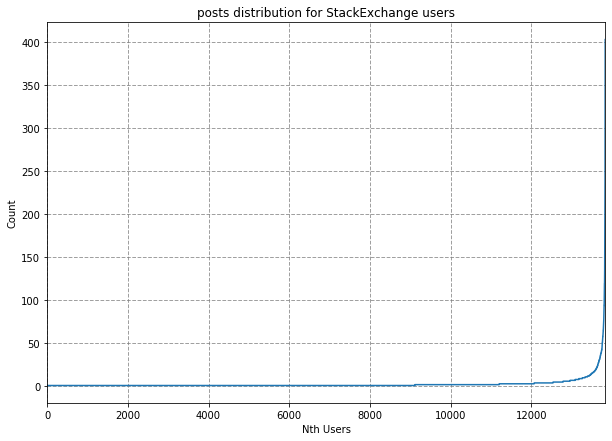

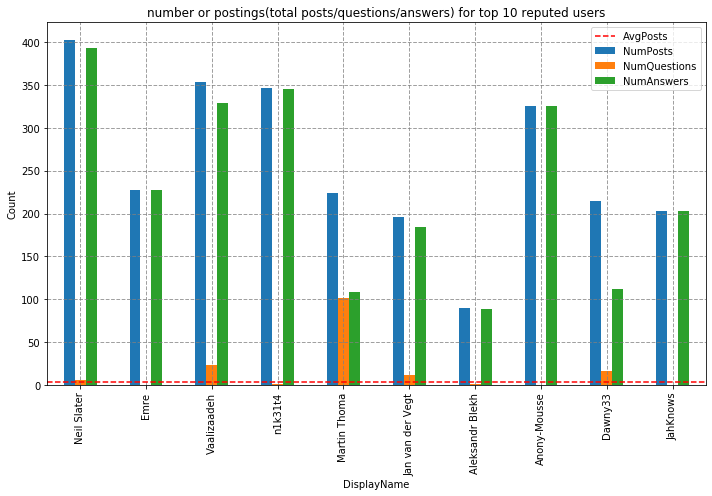

In [4]:
# posts per user
plt.figure(1)
fig, ax = plt.subplots(figsize=(10,7))
posts_per_user_df['count'].plot(ax=ax)
ax.set_xlabel("Nth Users")
ax.set_ylabel("Count")
ax.set_title('posts distribution for StackExchange users')
ax.grid(color='grey', linestyle='--', linewidth=1, alpha=0.75)
# top 10 bar chart dataframes
plt.figure(2)
top_10_viz_df = top_10_posts_df.merge(top_10_Qs_df[['UserId', 'NumQuestions']], on='UserId', how='outer')\
.merge(top_10_As_df[['UserId', 'NumAnswers']], on='UserId', how='outer').fillna(0)
top_10_viz_df['NumPosts'] = top_10_viz_df['NumPosts'].astype('Int64')
top_10_viz_df['NumQuestions'] = top_10_viz_df['NumQuestions'].astype('Int64')
top_10_viz_df['NumAnswers'] = top_10_viz_df['NumAnswers'].astype('Int64')
print(top_10_viz_df)
# plot data
fig, ax = plt.subplots(figsize=(10,7), tight_layout=True)
ax.axhline(y=posts_per_user_df['count'].mean(), linestyle='--', color='red', label='AvgPosts')
# ax.axhline(y=Qs_per_user_df['count'].mean(), linestyle='--', color='green', label='AvgQuestionss')
top_10_viz_df.plot(kind='bar', ax=ax, x='DisplayName', y=['NumPosts', 'NumQuestions', 'NumAnswers'])
# set attrs
ax.set_xlabel("DisplayName")
ax.set_ylabel("Count")
ax.set_title('number or postings(total posts/questions/answers) for top 10 reputed users')
ax.grid(color='grey', linestyle='--', linewidth=1, alpha=0.75)
plt.legend()
plt.show()

### Findings from postings

 - NumPosts is the total number of postings users generated
 - NumQuestions is the number of questions users asked
 - NumAnswers is the number of answers users provided

From the means and medians for each posting activities, we can see that most users are tend to answer other's questions rather than ask questions themselves. Also these activites are not evenly distributed; more than half of people are having no more than 1 posting, 1 question, and 1 answer. From the bar chart showing activities for top 10 reputed users, we can see that top 10 reputed StackExchange users are way more active than average forum users. They also tend to provide answers to forum most of the time ranther than seek helps from the forum except for Martin Thoma who posted a close number of questions to his answers. In general, our observastion align with the data of average user activities showing that most users like to answer questions more.

In [5]:
# Bar charts comment counts, number counted from *comments* table
# https://meta.stackexchange.com/questions/7237/how-does-reputation-work
# Before our analysis, we know that comments or upvotes in comment will not be taken into account in reputation 
# calculation. However, we would still like to know whether posting comments or receiving upvotes in comments can
# encourage them to participate more in forum.
top_10_comments_query = '''
WITH t1 AS (
SELECT * FROM users 
ORDER BY reputation 
DESC LIMIT 10)
SELECT t1.Id AS UserId, t1.Reputation, t1.DisplayName, COUNT(c.id) AS NumComments
FROM t1 LEFT JOIN comments AS c
ON (c.UserId = t1.Id)
GROUP BY t1.Id
ORDER BY t1.Reputation DESC;
'''
comments_per_user_query = '''
SELECT UserId, COUNT(Id) AS count
FROM comments
WHERE UserId IS NOT NULL AND UserId != -1
GROUP BY UserId
ORDER BY count;
'''
top_10_comments_df = pd.read_sql_query(top_10_comments_query, con=conn)
comments_per_user_df = pd.read_sql_query(comments_per_user_query, con=conn)
print('Mean:', comments_per_user_df['count'].mean())
print('Median:', comments_per_user_df['count'].median())
print('Mean Top10:', top_10_comments_df['NumComments'].mean())

Mean: 5.183885071830106
Median: 2.0
Mean Top10: 538.0


   UserId  Reputation       DisplayName  NumComments
0     836       18824       Neil Slater         1199
1     381        8881              Emre         1246
2   28175        8710       Vaalizaadeh          839
3   45264        8181           n1k31t4          365
4    8820        7157      Martin Thoma          277
5   14904        6995  Jan van der Vegt          197
6    2452        6098   Aleksandr Blekh          159
7     924        5971      Anony-Mousse          463
8   11097        5798           Dawny33          285
9   29587        5782          JahKnows          350


<Figure size 432x288 with 0 Axes>

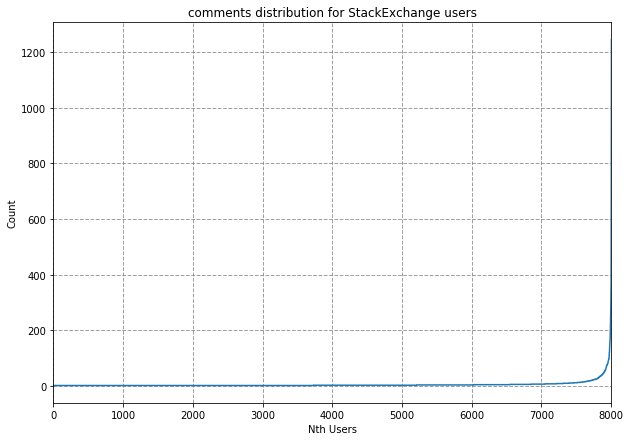

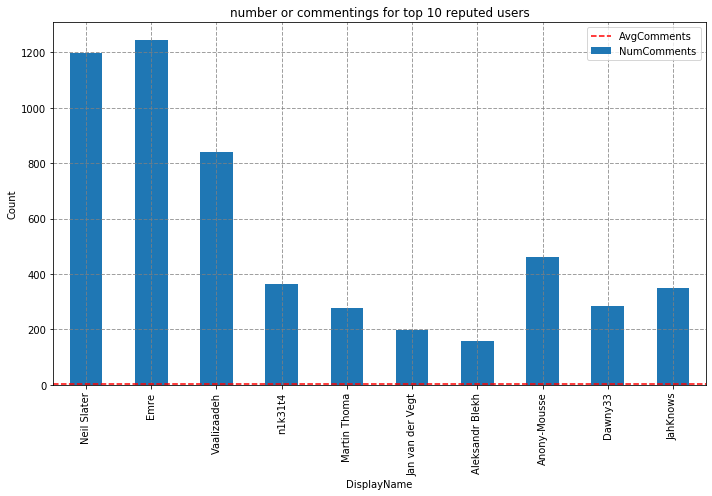

In [6]:
# comments distribution
plt.figure(1)
fig, ax = plt.subplots(figsize=(10,7))
comments_per_user_df['count'].plot(ax=ax)
ax.set_xlabel("Nth Users")
ax.set_ylabel("Count")
ax.set_title('comments distribution for StackExchange users')
ax.grid(color='grey', linestyle='--', linewidth=1, alpha=0.75)
print(top_10_comments_df)
# plot data
plt.figure(2)
fig, ax = plt.subplots(figsize=(10,7), tight_layout=True)
ax.axhline(y=posts_per_user_df['count'].mean(), linestyle='--', color='red', label='AvgComments')
top_10_comments_df.plot(kind='bar', ax=ax, x='DisplayName', y='NumComments')
# set attrs
ax.set_xlabel("DisplayName")
ax.set_ylabel("Count")
ax.set_title('number or commentings for top 10 reputed users')
ax.grid(color='grey', linestyle='--', linewidth=1, alpha=0.75)
plt.legend()
plt.show()

### Findings from commentings

 - NumComments is the total number of commentings users generated

For stackexchange datascience forum, we calculated that average user comments are 5 and more than half of users post at most 2 comments. Unsuprisingly, commenting activities for our top 10 reputed users are way exceeding the average, with 500+ average comments and over 1k commenting activities for our top 2 users, Neil Slater and Emre. 

## Social Network in StackExchange Datascience forum
After we studied how many postings and commentings our top reputed users generated in their entire histories, we want to know how diverse/broad are their social networks in the StackExchange datascience forum. That means we will need to draw a network for user activities. But since it is inpractical to draw any insights from a network with more than 60k user nodes. A downsampling algorithm will be needed.

In [91]:
def plotly_graph(G: nx.Graph, pos: dict, highlight: list = None, title: str = ''):
    ''' 
    G         : networkx graph
    pos       : positions of graph node
    highlight : highlight nodes
    title     : graph title 
    '''
    Xv=[pos[n][0] for n in list(G.nodes())]
    Yv=[pos[n][1] for n in list(G.nodes())]
    Xed=[]
    Yed=[]
    for edge in list(G.edges()):
        Xed+=[pos[edge[0]][0],pos[edge[1]][0], None]
        Yed+=[pos[edge[0]][1],pos[edge[1]][1], None]
    edge_trace=go.Scatter(x=Xed,
               y=Yed,
               mode='lines',
               line=dict(color='rgb(210,210,210)', width=1),
               name='link'
               )
    node_trace=go.Scatter(x=Xv,
               y=Yv,
               mode='markers',
               name='users',
               marker=dict(symbol='circle',
                             size=5,
                             color='#6959CD',
                             line=dict(color='rgb(50,50,50)', width=0.5)
                             )
               )
    if highlight is None:
        data=[edge_trace, node_trace]
    else:
        Xh=[pos[n][0] for n in list(G.nodes()) if n in highlight]
        Yh=[pos[n][1] for n in list(G.nodes()) if n in highlight]
        labels=[n[1] for n in list(G.nodes(data=True)) if n[0] in highlight]
        hightlight_trace=go.Scatter(x=Xh,
               y=Yh,
               mode='markers',
               name='top users',
               marker=dict(symbol='circle',
                             size=5,
                             color='#b02b26',
                             line=dict(color='rgb(50,50,50)', width=0.5)
                             ),
               text=labels
               )
        
        data=[edge_trace, node_trace, hightlight_trace]
    # draw figure
    fig=go.Figure(data=data)
    fig.update_layout(
        title=title
    )
    return fig.show()

In [8]:
topn_posts_weighted_digraph_query = '''
WITH t1 AS (
SELECT p.OwnerUserId AS SourceUserId, u.DisplayName AS SourceDisplayName, 
u.Reputation AS SourceReputation, p.ParentId AS TargetPostId
FROM posts AS p LEFT JOIN users AS u
ON (p.OwnerUserId = u.Id)
WHERE p.OwnerUserId IN (
SELECT Id FROM users ORDER BY Reputation DESC LIMIT {n} OFFSET {pos}
)
AND p.PostTypeId = 2
AND p.ParentId IS NOT NULL
ORDER BY p.OwnerUserId)
SELECT t1.SourceUserId, t1.SourceDisplayName, t1.SourceReputation, p.OwnerUserId AS TargetUserId, COUNT(*) AS weight
FROM t1 LEFT JOIN posts AS p
ON (t1.TargetPostId = p.Id)
WHERE p.OwnerUserId > -1
GROUP BY SourceUserId, TargetUserId;
'''

In [9]:
# connections for top 10 reputed people posts weighted directed graph
top10_posts_weighted_digraph_query = topn_posts_weighted_digraph_query.format(n=10, pos=0)
# weighted directed graph dataframe for post
top10_posts_weighted_digraph_df = pd.read_sql_query(top10_posts_weighted_digraph_query, con=conn)
# weighted directed graph nx.DiGraph for post
top10_posts_weighted_digraph_G = nx.from_pandas_edgelist(top10_posts_weighted_digraph_df, 'SourceUserId', 
                                                         'TargetUserId', ['weight'], create_using=nx.DiGraph())
# add node attributes: DisplayNames and Reputations
top10_nodes_df = top10_posts_weighted_digraph_df.drop_duplicates(subset=['SourceUserId', 
                       'SourceDisplayName', 'SourceReputation'])[['SourceUserId', 
                        'SourceDisplayName', 'SourceReputation']]
nx.set_node_attributes(top10_posts_weighted_digraph_G, 
                       pd.Series(top10_nodes_df.SourceDisplayName.values, 
                       index=top10_nodes_df.SourceUserId).to_dict(), 'DisplayName')
nx.set_node_attributes(top10_posts_weighted_digraph_G, 
                       pd.Series(top10_nodes_df.SourceReputation.values, 
                       index=top10_nodes_df.SourceUserId).to_dict(), 'Reputation')
print('number of nodes:', top10_posts_weighted_digraph_G.number_of_nodes())
print('number of edges:', top10_posts_weighted_digraph_G.number_of_edges())

number of nodes: 1708
number of edges: 1998


In [86]:
# different node layouts
spri_pos = nx.spring_layout(top10_posts_weighted_digraph_G)
circ_pos = nx.circular_layout(top10_posts_weighted_digraph_G)
kaka_pos = nx.kamada_kawai_layout(top10_posts_weighted_digraph_G)
spec_pos = nx.spectral_layout(top10_posts_weighted_digraph_G)

In [92]:
# top 10 reputed user
plotly_graph(G=top10_posts_weighted_digraph_G, pos=spri_pos, 
             highlight=top10_nodes_df['SourceUserId'].tolist(),
             title='posting connections for top 10 reputed users - spring layout')
plotly_graph(G=top10_posts_weighted_digraph_G, pos=spec_pos, 
             highlight=top10_nodes_df['SourceUserId'].tolist(), 
             title='posting connections for top 10 reputed users - spectral layout')
plotly_graph(G=top10_posts_weighted_digraph_G, pos=circ_pos, 
             highlight=top10_nodes_df['SourceUserId'].tolist(), 
             title='posting connections for top 10 reputed users - circular layout')
plotly_graph(G=top10_posts_weighted_digraph_G, pos=kaka_pos, 
             highlight=top10_nodes_df['SourceUserId'].tolist(), 
             title='posting connections for top 10 reputed users - kamada kawai layout')

In [12]:
# connections for top 100 reputed people posts weighted directed graph
top100_posts_weighted_digraph_query = topn_posts_weighted_digraph_query.format(n=100, pos=0)
# weighted directed graph dataframe for post
top100_posts_weighted_digraph_df = pd.read_sql_query(top100_posts_weighted_digraph_query, con=conn)
# weighted directed graph nx.DiGraph for post
top100_posts_weighted_digraph_G = nx.from_pandas_edgelist(top100_posts_weighted_digraph_df, 'SourceUserId', 
                                                          'TargetUserId', ['weight'], create_using=nx.DiGraph())
top100_nodes_df = top100_posts_weighted_digraph_df.drop_duplicates(subset=['SourceUserId', 
                       'SourceDisplayName', 'SourceReputation'])[['SourceUserId', 
                        'SourceDisplayName', 'SourceReputation']]
nx.set_node_attributes(top100_posts_weighted_digraph_G, 
                       pd.Series(top100_nodes_df.SourceDisplayName.values, 
                       index=top100_nodes_df.SourceUserId).to_dict(), 'DisplayName')
nx.set_node_attributes(top100_posts_weighted_digraph_G, 
                       pd.Series(top100_nodes_df.SourceReputation.values, 
                       index=top100_nodes_df.SourceUserId).to_dict(), 'Reputation')
print('number of nodes:', top100_posts_weighted_digraph_G.number_of_nodes())
print('number of edges:', top100_posts_weighted_digraph_G.number_of_edges())

number of nodes: 4362
number of edges: 6634


In [87]:
# different node layouts
top100_spring_pos = nx.spring_layout(top100_posts_weighted_digraph_G)
top100_circ_pos = nx.circular_layout(top100_posts_weighted_digraph_G)
top100_kaka_pos = nx.kamada_kawai_layout(top100_posts_weighted_digraph_G)
top100_spec_pos = nx.spectral_layout(top100_posts_weighted_digraph_G)

In [93]:
# top 100 reputed user
plotly_graph(G=top100_posts_weighted_digraph_G, pos=top100_spring_pos, 
             highlight=top100_nodes_df['SourceUserId'].tolist(), 
             title='postings fo top 100 reputed users - spring layout')
plotly_graph(G=top100_posts_weighted_digraph_G, pos=top100_spec_pos, 
             highlight=top100_nodes_df['SourceUserId'].tolist(), 
             title='postings fo top 100 reputed users - spectral layout')
plotly_graph(G=top100_posts_weighted_digraph_G, pos=top100_circ_pos, 
             highlight=top100_nodes_df['SourceUserId'].tolist(), 
             title='postings fo top 100 reputed users - circular layout')
plotly_graph(G=top100_posts_weighted_digraph_G, pos=top100_kaka_pos, 
             highlight=top100_nodes_df['SourceUserId'].tolist(), 
             title='postings fo top 100 reputed users - Kamada-Kawai layout')

At this point we think we have reached a good state where all the top reputed users are strongly connected and outliers are frequently showing up. One of the outliers that has ranked top 10 is Aleksandr Blekh, our first assumption is that he gained massive upvotes in some of his answers. We then went to his StackExchange profile and found out he actually is an active member in multiple forums and has gained his reputation outside of datascience forum.

### 3D network visualization

A 3D network will provide a better vision on connectivities compares to 2D, this especially helps when graph nodes and edges get larger to some point that its tracability is lost on 2D plot. Due to the limitation of our personal laptop, we could only 

In [17]:
topn_posts_weighted_digraph_limited_query = '''
WITH t1 AS (
SELECT p.OwnerUserId AS SourceUserId, u.DisplayName AS SourceDisplayName, 
u.Reputation AS SourceReputation, p.ParentId AS TargetPostId
FROM posts AS p LEFT JOIN users AS u
ON (p.OwnerUserId = u.Id)
WHERE p.OwnerUserId IN (
SELECT Id FROM users ORDER BY Reputation DESC LIMIT {n} OFFSET {pos}
)
AND p.PostTypeId = 2
AND p.ParentId IS NOT NULL
ORDER BY p.OwnerUserId)
SELECT t1.SourceUserId, t1.SourceDisplayName, t1.SourceReputation, p.OwnerUserId AS TargetUserId, COUNT(*) AS weight
FROM t1 LEFT JOIN posts AS p
ON (t1.TargetPostId = p.Id)
WHERE p.OwnerUserId IN (
SELECT Id FROM users ORDER BY Reputation DESC LIMIT {lim}
)
GROUP BY SourceUserId, TargetUserId;
'''

# top 10 UserIds
top10_list = top_10_viz_df['UserId'].tolist()
# load jgraph html template
jgraph_template = open('template.html', 'r').read()
# create html folder in graph_viz filder
try:
    os.mkdir('graph_viz')
except OSError:
    pass
jquery_content = open('jgraph/js/jquery-1.11.1.min.js', 'r').read()
open(join('graph_viz', 'jquery-1.11.1.min.js'), 'w+').write(jquery_content)
jgraph_content = open('jgraph/js/build/jgraph.min.js', 'r').read()
open(join('graph_viz', 'jgraph.min.js'), 'w+').write(jgraph_content)


def nx_graph_to_jgraph(G: nx.Graph, highlight: list = top10_list):
    graph = {'nodes':{}, 'edges': []}
    for n in list(G.nodes()):
        if n in highlight:
            graph['nodes'][n] = { 'color': 0xff3844 }
        else:
            graph['nodes'][n] = { 'color': 0x0b5394 }
    graph['edges'] = [{'source':s, 'target':t} for (s,t) in list(G.edges())]
    jgraph.draw(graph, directed=False, size=(600, 400), shader="phong", z=200)


def nx_graph_write_to_json(G: nx.Graph, fname: str, highlight: list = top10_list):
    graph = {'nodes':{}, 'edges': []}
    for n in list(G.nodes()):
        if n in highlight:
            graph['nodes'][n] = { 'color': '0xff3844' }
        else:
            graph['nodes'][n] = { 'color': '0x0b5394' }
    graph['edges'] = [{'source':s, 'target':t} for (s,t) in list(G.edges())]
    return open(fname, 'w+').write(json.dumps(graph))
    
    
def write_jgraph_html(G: nx.Graph, fname: str, topic: str = '', highlight: list = top10_list):
    graph = {'nodes':{}, 'edges': []}
    for n in list(G.nodes()):
        if n in highlight:
            graph['nodes'][n] = { 'color': '0xff3844' }
        else:
            graph['nodes'][n] = { 'color': '0x0b5394' }
    graph['edges'] = [{'source':s, 'target':t} for (s,t) in list(G.edges())]
    datajson = json.dumps(graph)
    return open(fname, 'w+').write(jgraph_template.replace('{{topic}}', topic)
                                  .replace('{{jsondata}}', datajson))

In [18]:
# connections for top 50 reputed people posts weighted directed graph
top50_posts_digraph_limited_query = topn_posts_weighted_digraph_limited_query.format(n=50, pos=0, lim=500)
# weighted directed graph dataframe for post
top50_posts_digraph_limited_df = pd.read_sql_query(top50_posts_digraph_limited_query, con=conn)
# weighted directed graph nx.DiGraph for post
top50_posts_digraph_limited_G = nx.from_pandas_edgelist(top50_posts_digraph_limited_df, 'SourceUserId', 
                                                          'TargetUserId', ['weight'], create_using=nx.DiGraph())
# top 50
top50_nodes_df = top50_posts_digraph_limited_df.drop_duplicates(subset=['SourceUserId', 
                       'SourceDisplayName', 'SourceReputation'])[['SourceUserId', 
                        'SourceDisplayName', 'SourceReputation']]
print('number of nodes:', top50_posts_digraph_limited_G.number_of_nodes())
print('number of edges:', top50_posts_digraph_limited_G.number_of_edges())

number of nodes: 232
number of edges: 614


In [101]:
top50_lim500_html_name = join('graph_viz', 'top50_lim500.html')
# nx_graph_write_to_json(G=top50_posts_digraph_limited_G, fname=jsonfile, 
#                        highlight=top50_nodes_df['SourceUserId'].tolist())
write_jgraph_html(G=top50_posts_digraph_limited_G, fname=top50_lim500_html_name, 
                  topic='top 50 users 500 limited social network',
                  highlight=top50_nodes_df['SourceUserId'].tolist())
print('avg clustering coefficient:', nx.average_clustering(top50_posts_digraph_limited_G))

avg clustering coefficient: 0.06411356258508641


In [21]:
# this is a 3d network between top 50 and top 500 reputed users, red nodes are top 50
# nx_graph_to_jgraph(G=top50_posts_digraph_limited_G, highlight=top50_nodes_df['SourceUserId'].tolist())
IFrame(src='http://localhost:8000/'+top50_lim500_html_name, width=800, height=600)

In [22]:
# connections for ranked 50 to 100 reputed people posts weighted directed graph
top50to100_posts_digraph_limited_query = topn_posts_weighted_digraph_limited_query.format(n=50, pos=50, lim=1000)
# weighted directed graph dataframe for post
top50to100_posts_digraph_limited_df = pd.read_sql_query(top50to100_posts_digraph_limited_query, con=conn)
# weighted directed graph nx.DiGraph for post
top50to100_posts_digraph_limited_G = nx.from_pandas_edgelist(top50to100_posts_digraph_limited_df, 'SourceUserId', 
                                                          'TargetUserId', ['weight'], create_using=nx.DiGraph())
# top 50 to 100
top50to100_nodes_df = top50to100_posts_digraph_limited_df.drop_duplicates(subset=['SourceUserId', 
                       'SourceDisplayName', 'SourceReputation'])[['SourceUserId', 
                        'SourceDisplayName', 'SourceReputation']]
print('number of nodes:', top50to100_posts_digraph_limited_G.number_of_nodes())
print('number of edges:', top50to100_posts_digraph_limited_G.number_of_edges())

number of nodes: 257
number of edges: 427


In [100]:
top50to100_lim1000_html_name = join('graph_viz', 'top50to100_lim1000.html')
# nx_graph_write_to_json(G=top50to100_posts_digraph_limited_G, fname=jsonfile, 
#                        highlight=top50to100_nodes_df['SourceUserId'].tolist())
write_jgraph_html(G=top50to100_posts_digraph_limited_G, fname=top50to100_lim1000_html_name, 
                  topic='top 50 to 100 users 1000 limited social network',
                  highlight=top50to100_nodes_df['SourceUserId'].tolist())
print('avg clustering coefficient:', nx.average_clustering(top50to100_posts_digraph_limited_G))

avg clustering coefficient: 0.014375932363458115


In [98]:
# this is a 3d network between (ranked 50 to 100) and top 1000 reputed users, red nodes are (ranked 50 to 100)
# nx_graph_to_jgraph(G=top50to100_posts_digraph_limited_G, highlight=top50to100_nodes_df['SourceUserId'].tolist())
IFrame(src='http://localhost:8000/'+top50to100_lim1000_html_name, width=800, height=600)

In [25]:
# connections for ranked 100 to 150 reputed people posts weighted directed graph
top100to150_posts_digraph_limited_query = topn_posts_weighted_digraph_limited_query.format(n=50, pos=100, lim=1000)
# weighted directed graph dataframe for post
top100to150_posts_digraph_limited_df = pd.read_sql_query(top100to150_posts_digraph_limited_query, con=conn)
# weighted directed graph nx.DiGraph for post
top100to150_posts_digraph_limited_G = nx.from_pandas_edgelist(top100to150_posts_digraph_limited_df, 'SourceUserId', 
                                                          'TargetUserId', ['weight'], create_using=nx.DiGraph())
# top 50 to 100
top100to150_nodes_df = top100to150_posts_digraph_limited_df.drop_duplicates(subset=['SourceUserId', 
                       'SourceDisplayName', 'SourceReputation'])[['SourceUserId', 
                        'SourceDisplayName', 'SourceReputation']]
print('number of nodes:', top100to150_posts_digraph_limited_G.number_of_nodes())
print('number of edges:', top100to150_posts_digraph_limited_G.number_of_edges())

number of nodes: 202
number of edges: 266


In [102]:
top100to150_lim1000_html_name = join('graph_viz', 'top100to150_lim1000.html')
# nx_graph_write_to_json(G=top100to150_posts_digraph_limited_G, fname=jsonfile, 
#                        highlight=top100to150_nodes_df['SourceUserId'].tolist())
write_jgraph_html(G=top100to150_posts_digraph_limited_G, fname=top100to150_lim1000_html_name, 
                  topic='top 100 to 150 users 1000 limited social network',
                  highlight=top100to150_nodes_df['SourceUserId'].tolist())
print('avg clustering coefficient:', nx.average_clustering(top100to150_posts_digraph_limited_G))

avg clustering coefficient: 0.0036266126612661265


In [27]:
# this is a 3d network between (ranked 100 to 150) and top 1000 reputed users, red nodes are (ranked 100 to 150)
# nx_graph_to_jgraph(G=top100to150_posts_digraph_limited_G, highlight=top100to150_nodes_df['SourceUserId'].tolist())
IFrame(src='http://localhost:8000/'+top100to150_lim1000_html_name, width=800, height=600)

In [36]:
# connections for ranked 150 to 200 reputed people posts weighted directed graph
top150to200_posts_digraph_limited_query = topn_posts_weighted_digraph_limited_query.format(n=100, pos=150, lim=1000)
# weighted directed graph dataframe for post
top150to200_posts_digraph_limited_df = pd.read_sql_query(top150to200_posts_digraph_limited_query, con=conn)
# weighted directed graph nx.DiGraph for post
top150to200_posts_digraph_limited_G = nx.from_pandas_edgelist(top150to200_posts_digraph_limited_df, 'SourceUserId', 
                                                          'TargetUserId', ['weight'], create_using=nx.DiGraph())
# top 150 to 200
top150to200_nodes_df = top150to200_posts_digraph_limited_df.drop_duplicates(subset=['SourceUserId', 
                       'SourceDisplayName', 'SourceReputation'])[['SourceUserId', 
                        'SourceDisplayName', 'SourceReputation']]
print('number of nodes:', top150to200_posts_digraph_limited_G.number_of_nodes())
print('number of edges:', top150to200_posts_digraph_limited_G.number_of_edges())

number of nodes: 305
number of edges: 398


In [103]:
top150to250_lim1000_html_name = join('graph_viz', 'top150to250_lim1000.html')
# nx_graph_write_to_json(G=top100to150_posts_digraph_limited_G, fname=jsonfile, 
#                        highlight=top100to150_nodes_df['SourceUserId'].tolist())
write_jgraph_html(G=top150to200_posts_digraph_limited_G, fname=top150to250_lim1000_html_name, 
                  topic='top 150 to 250 users 1000 limited social network',
                  highlight=top150to200_nodes_df['SourceUserId'].tolist())
print('avg clustering coefficient:', nx.average_clustering(top150to200_posts_digraph_limited_G))

avg clustering coefficient: 0.0023419203747072595


In [39]:
# this is a 3d network between (ranked 100 to 150) and top 1000 reputed users, red nodes are (ranked 100 to 150)
# nx_graph_to_jgraph(G=top100to150_posts_digraph_limited_G, highlight=top100to150_nodes_df['SourceUserId'].tolist())
IFrame(src='http://localhost:8000/'+top150to250_lim1000_html_name, width=800, height=600)

In [167]:
def display_top_n_network(n: int, highlight_num: int = 500000):
    if highlight_num > n:
        highlight_num = n
    topn_users_network_query = '''
        WITH t1 AS (
        SELECT p.OwnerUserId AS SourceUserId, u.DisplayName AS SourceDisplayName, 
        u.Reputation AS SourceReputation, p.ParentId AS TargetPostId
        FROM posts AS p LEFT JOIN users AS u
        ON (p.OwnerUserId = u.Id)
        WHERE p.OwnerUserId IN (
        SELECT Id FROM users ORDER BY Reputation DESC LIMIT {n}
        )
        AND p.PostTypeId = 2
        AND p.ParentId IS NOT NULL
        ORDER BY SourceReputation)
        SELECT t1.SourceUserId, t1.SourceDisplayName, t1.SourceReputation, 
        p.OwnerUserId AS TargetUserId, COUNT(*) AS weight
        FROM t1 LEFT JOIN posts AS p
        ON (t1.TargetPostId = p.Id)
        WHERE p.OwnerUserId IN (SELECT SourceUserId FROM t1)
        GROUP BY SourceUserId, TargetUserId;
    '''
    highlight_num_query = ''' SELECT Id FROM users ORDER BY Reputation DESC LIMIT {h} '''.format(h=highlight_num)
    # weighted directed graph dataframe
    topn_users_network_df = pd.read_sql_query(topn_users_network_query.format(n=n), con=conn)
    # weighted directed graph nx.DiGraph for post
    topn_users_network_G = nx.from_pandas_edgelist(topn_users_network_df, 
                                                                  'SourceUserId', 'TargetUserId', 
                                                                  ['weight'], create_using=nx.DiGraph())
    # highlight nodes dataframe
    highlight_nodes_df = pd.read_sql_query(highlight_num_query, con=conn)
    print('number of nodes:', topn_users_network_G.number_of_nodes())
    print('number of edges:', topn_users_network_G.number_of_edges())
    # generate html
    topn_html_name = join('graph_viz', 'top{n}_users_network.html'.format(n=n))
    write_jgraph_html(G=topn_users_network_G, fname=topn_html_name, 
                  topic='top {n} users posting network, red node(s) is(are) top {h}'.format(n=n, h=highlight_num),
                  highlight=highlight_nodes_df['Id'].tolist())
    # repoty clustering coeffcient stat
    print('avg clustering coefficient:', nx.average_clustering(topn_users_network_G))
    # display IFrame
    return IFrame(src='http://localhost:8000/'+topn_html_name, width=800, height=600)

In [182]:
display_top_n_network(n=500, highlight_num=10)

number of nodes: 422
number of edges: 1419
avg clustering coefficient: 0.054107301708455714


In [28]:
# connections for top 10 reputed people posts weighted directed graph
top10_posts_digraph_limited_query = topn_posts_weighted_digraph_limited_query.format(n=10, pos=0, lim=500000)
# weighted directed graph dataframe for post
top10_posts_digraph_limited_df = pd.read_sql_query(top10_posts_digraph_limited_query, con=conn)
# weighted directed graph nx.DiGraph for post
top10_posts_digraph_limited_G = nx.from_pandas_edgelist(top10_posts_digraph_limited_df, 'SourceUserId', 
                                                          'TargetUserId', ['weight'], create_using=nx.DiGraph())
# top 10 nodes
top10_nodes_df = top10_posts_digraph_limited_df.drop_duplicates(subset=['SourceUserId', 
                       'SourceDisplayName', 'SourceReputation'])[['SourceUserId', 
                        'SourceDisplayName', 'SourceReputation']]
print('number of nodes:', top10_posts_digraph_limited_G.number_of_nodes())
print('number of edges:', top10_posts_digraph_limited_G.number_of_edges())

number of nodes: 1708
number of edges: 1998


In [104]:
top10_nolimit_html_name = join('graph_viz', 'top10_nolimit.html')
# nx_graph_write_to_json(G=top10_posts_digraph_limited_G, fname=jsonfile, 
#                        highlight=top100to150_nodes_df['SourceUserId'].tolist())
write_jgraph_html(G=top10_posts_digraph_limited_G, fname=top10_nolimit_html_name, 
                  topic='top 10 users full social network',
                  highlight=top10_nodes_df['SourceUserId'].tolist())
print('avg clustering coefficient:', nx.average_clustering(top10_posts_digraph_limited_G))

avg clustering coefficient: 0.021885449288346934


In [194]:
# this is a 3d network between top 10 and every StackExchange users, red nodes are top 10 users
# nx_graph_to_jgraph(G=top10_posts_digraph_limited_G)
IFrame(src='http://localhost:8000/'+top10_nolimit_html_name, width=600, height=400)

### Findings on 3D networks

Due the machine performance bottleneck, it is inpossible to render a full StackExchange datascience users network. Instead, we downsampled our dataset by user's reputation rank and we constrained the social interactions between not every users but only those top 500 users for top 50 and top 1000 users for ranked 50 to 100 and ranked 100 to 150. First one is a 3d network between top 50 and top 500 reputed users, red nodes are top 50 users. We observed that our top 10 users are strongly connected and at center of this 3d network. We then focus our user group to 50 users ranked between 50 to 100, we could immediately see that our studied user group are widely distributed compares to our top 50 users. From this graph, we saw that the connection are weaker than first one and this is having double the number of interacting users. We further continued by focusing on ranked 100 to 150 user groups and we obtained similar results and with even more sparse connections. Last graph is a full posting network for our top 10 reputed users and our machine barely rendered this graph. The purpose of this graph is to validify our downsampling methodology. From the graph, every top user node is having massive connections with outside user nodes that don't have many connections with each other. From our previous analysis, we agreed that these leaf-like user nodes can be represented as average users and most of those links are answers links. This justify our menthodologies by showing very few connections between average users and only the top ranked users are strongly connected and positioning at the center of the network.